# Visualize the data from the beamtime 07/25

In [1]:
from pathlib import Path

In [2]:
# load the name space
%run -i ../tomography/utils.py

## Load the data files in a list

In [3]:
# here is all the data files
DATA_FILES = list(sorted(Path("/Volumes/STAO_EXT/processed_data_khalifah/datasets/").glob("[!.]*.nc")))
for i, f in enumerate(DATA_FILES):
    print("{:02d} {}".format(i, f.stem))
    del i, f

00 CG-0032_cb427382-2015-41b8-8d6d-aad41d84488d
01 CG-0032_d356b0d8-6090-4bd4-9e39-e8bd2c32431e
02 CG-0046_1098ceb5-1cf5-4dc0-8e1e-7f0b2ba7ab08
03 CG-0046_1098ceb5-1cf5-4dc0-8e1e-7f0b2ba7ab08_processed_rocking_curve
04 CG-0046_1854f609-2ea8-4bc5-9b5e-31705400a609_2
05 CG-0046_3e7f4231-d379-459c-bf33-1e11aedabe73_2
06 CG-0046_3fa5bb56-9948-4014-9ba9-62258d5cf024_2
07 CG-0046_4c3a71a5-3046-418e-8ea1-3e009f2d9877
08 CG-0046_4c3a71a5-3046-418e-8ea1-3e009f2d9877_processed_rocking_curve
09 CG-0046_7a7fc1bc-16eb-4f60-837e-2ffca6e7c41a
10 CG-0046_a6850805-f516-45b1-8d5f-63cab7248f67
11 CG-0046_aca27038-de6b-4122-a5c6-d4951fb0ed98
12 CG-0046_becb426c-a3e8-442b-913f-01fc16dfe762
13 CG-0046_d73ebc8e-d5b7-4ac1-8f82-95aa2414f2b3
14 CG-0046_fef1f2f7-301c-41c6-a775-d89e1fe0af23
15 CG-0048_b266cb75-2bca-49d4-92de-bbd56a4f7291
16 CG-0048_b266cb75-2bca-49d4-92de-bbd56a4f7291_1
17 CG-0048_b266cb75-2bca-49d4-92de-bbd56a4f7291_2
18 PARADIM-1_1d57df3d-d089-47b8-9f36-1d3c343c5528
19 PARADIM-1_46e695e0-1638-4

## CG-0032

In [15]:
ds = xr.load_dataset(DATA_FILES[0])
ds

<xarray.Dataset>
Dimensions:    (dim_0: 137, dim_1: 29, grain: 80, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * dim_0      (dim_0) float64 9.0 9.25 9.5 9.75 10.0 ... 42.25 42.5 42.75 43.0
  * grain      (grain) int32 122 89 104 101 179 116 ... 118 51 136 154 204 54
  * dim_1      (dim_1) float64 60.5 60.75 61.0 61.25 ... 66.75 67.0 67.25 67.5
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) int16 317 316 312 317 311 ... 325 313 310 321
    light      (pixel_y, pixel_x) int16 14 15 15 17 16 16 ... 19 17 15 42 15 14
    intensity  (grain, dim_0, dim_1) float64 329.2 328.5 329.2 ... 311.7 311.2
    y          (grain) int32 2180 1377 1757 1744 3315 ... 662 2547 2745 3684 779
    dy         (grain) int32 50 50 50 50 50 50 50 50 ... 50 50 50 50 50 50 50 50
    x          (grain) int32 1448 1371 2770 2765 2015 ... 2637 148 1138 531 26
    dx         (grain) int32 50 50 50 50 50 50 50 50 ... 50 50 50 50 50 50 50 50
    Q          (grain) float64 22.22 46.51 42.69 42.8 ... 42.65 89.46 107.0

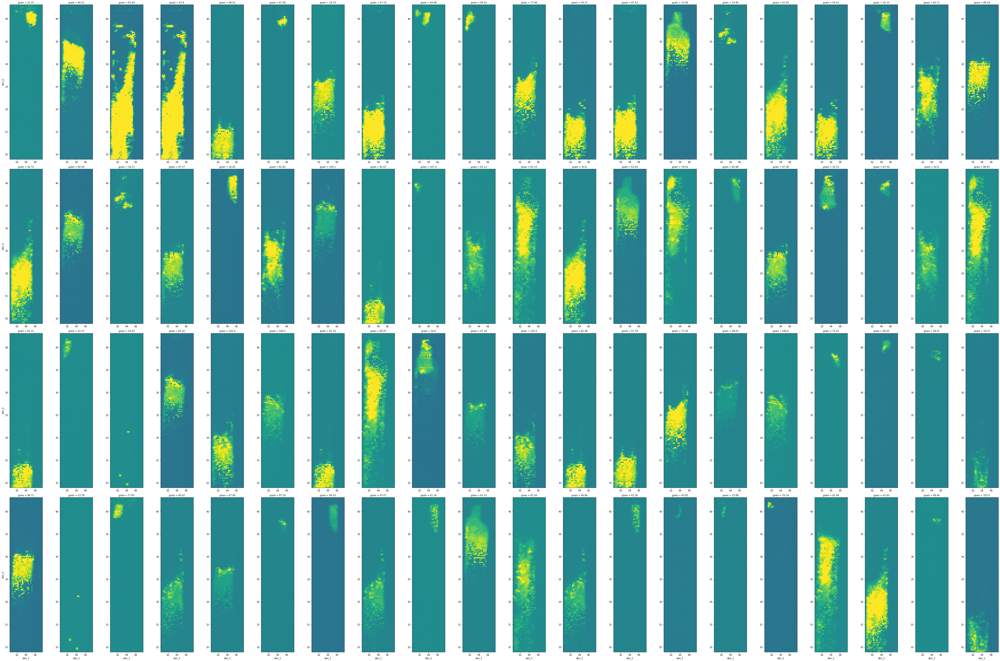

In [16]:
facet = ds.set_index({"grain": "Q"})["intensity"].plot.imshow(
    col="grain", col_wrap=20, 
    size=10, aspect=.3,
    vmin=ds["intensity"].mean() - 3 * ds["intensity"].std(),
    vmax=ds["intensity"].mean() + 3 * ds["intensity"].std(),
    add_colorbar=False, sharex=False, sharey=False
)
set_real_aspect(facet.axes)
plt.show()

In [68]:
ds = xr.load_dataset(DATA_FILES[1])
ds

<xarray.Dataset>
Dimensions:    (dim_0: 801, grain: 50, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * dim_0      (dim_0) float64 -1.0 -0.9975 -0.995 -0.9925 ... 0.995 0.9975 1.0
  * grain      (grain) int32 866 1345 865 212 949 598 ... 2036 851 2590 600 2143
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) int16 302 302 297 297 298 ... 308 298 297 303
    light      (pixel_y, pixel_x) int16 41 46 42 52 40 47 ... 44 52 48 48 44 55
    intensity  (grain, dim_0) float64 322.8 323.3 323.4 ... 322.4 322.4 323.0
    y          (grain) int32 1188 1755 1180 239 1279 ... 2611 1173 3123 815 2712
    dy         (grain) int32 30 30 30 30 30 30 30 30 ... 30 30 30 30 30 30 30 30
    x          (grain) int32 444 2769 1908 629 917 ... 2071 1884 2492 2923 1079
    dx         (grain) int32 30 30 30 30 30 30 30 30 ... 30 30 30 30 30 30 30 30
    Q          (grain) float64 81.98 42.7 47.59 106.0 ... 46.15 76.11 44.19

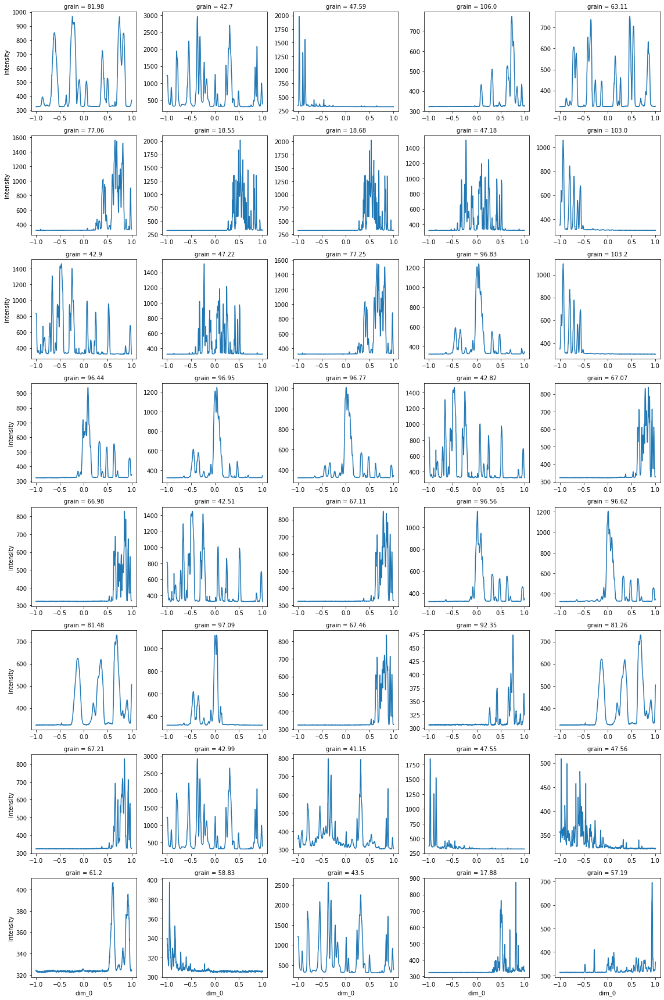

In [69]:
ds.set_index({"grain": "Q"})["intensity"][:40].plot.line(
    col="grain", col_wrap=5, 
    sharex=False, sharey=False
)
plt.show()

In [4]:
ds = xr.load_dataset(DATA_FILES[2])
ds

<xarray.Dataset>
Dimensions:    (dim_0: 801, grain: 50, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * dim_0      (dim_0) float64 89.0 89.0 89.0 89.01 ... 90.99 91.0 91.0 91.0
  * grain      (grain) int32 150 111 43 354 0 76 113 ... 146 172 208 279 165 62
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) int16 310 311 306 311 305 ... 320 306 305 314
    light      (pixel_y, pixel_x) int16 26 25 24 27 24 22 ... 26 24 25 27 25 25
    intensity  (grain, dim_0) float64 312.7 312.2 312.6 ... 327.0 326.7 327.0
    y          (grain) int32 1326 992 379 3828 37 ... 1538 1987 2940 1476 584
    dy         (grain) int32 70 70 70 70 70 70 70 70 ... 70 70 70 70 70 70 70 70
    x          (grain) int32 1671 2646 1533 2286 2516 ... 526 994 244 105 2936
    dx         (grain) int32 70 70 70 70 70 70 70 70 ... 70 70 70 70 70 70 70 70
    Q          (grain) float64 42.84 63.57 84.72 71.34 ... 82.04 88.98 84.63

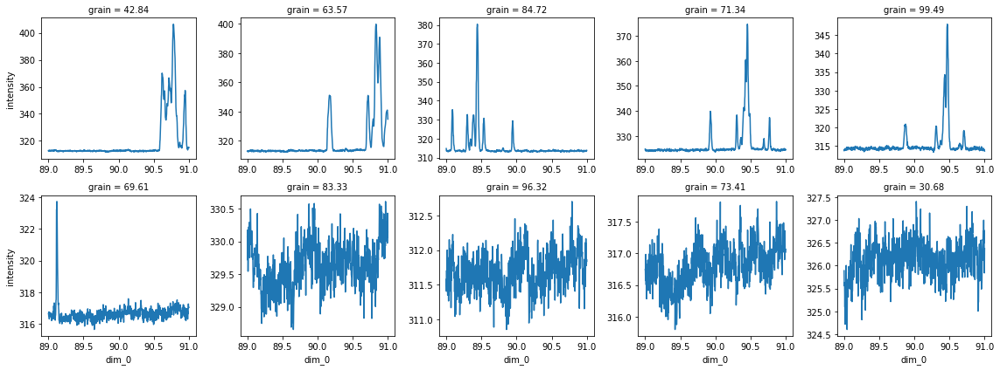

In [6]:
ds.set_index({"grain": "Q"})["intensity"][:10].plot.line(
    col="grain", col_wrap=5, 
    sharex=False, sharey=False
)
plt.show()

## CG-0046

In [7]:
ds = xr.load_dataset(DATA_FILES[4])
ds

<xarray.Dataset>
Dimensions:    (dim_0: 46, dim_1: 56, grain: 100, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * grain      (grain) int32 196 203 80 102 82 40 9 ... 141 144 64 127 3 190 142
  * dim_1      (dim_1) float64 60.0 60.1 60.2 60.3 60.4 ... 65.2 65.3 65.4 65.5
  * dim_0      (dim_0) float64 38.0 38.1 38.2 38.3 38.4 ... 42.2 42.3 42.4 42.5
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) int16 317 317 313 318 313 ... 326 314 310 321
    light      (pixel_y, pixel_x) int16 13 11 13 13 14 15 ... 18 14 13 16 15 14
    intensity  (grain, dim_0, dim_1) float64 305.7 305.9 326.0 ... 326.3 326.7
    y          (grain) int32 3583 3703 1264 1681 1328 ... 2374 147 3543 2629
    dy         (grain) int32 40 40 40 40 40 40 40 40 ... 40 40 40 40 40 40 40 40
    x          (grain) int32 2679 1575 2360 149 1665 ... 1316 2939 168 2407 1474
    dx         (grain) int32 40 40 40 40 40 40 40 40 ... 40 40 40 40 40 40 40 40
    Q          (grain) float64 67.53 67.0 47.5 83.55 ... 45.05 120.2 61.36 27.06

In [9]:
facet = ds.set_index({"grain": "Q"})["intensity"].plot.imshow(
    col="grain", col_wrap=20, 
    size=10, aspect=1.,
    vmin=ds["intensity"].mean() - 3 * ds["intensity"].std(),
    vmax=ds["intensity"].mean() + 3 * ds["intensity"].std(),
    add_colorbar=False, sharex=False, sharey=False
)
set_real_aspect(facet.axes)
plt.show()

In [10]:
ds = xr.load_dataset(DATA_FILES[5])
ds

<xarray.Dataset>
Dimensions:    (dim_0: 133, dim_1: 33, grain: 80, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * dim_0      (dim_0) float64 9.0 9.25 9.5 9.75 10.0 ... 41.25 41.5 41.75 42.0
  * grain      (grain) int32 32 13 43 55 53 39 64 92 ... 9 54 40 3 20 11 29 36
  * dim_1      (dim_1) float64 59.0 59.25 59.5 59.75 ... 66.25 66.5 66.75 67.0
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) int16 316 316 313 318 312 ... 326 313 309 320
    light      (pixel_y, pixel_x) int16 17 15 16 14 15 15 ... 17 15 15 17 17 16
    intensity  (grain, dim_0, dim_1) float64 311.6 312.1 312.1 ... 316.9 316.8
    y          (grain) int32 1004 390 1335 1983 1763 ... 177 617 360 832 1139
    dy         (grain) int32 60 60 60 60 60 60 60 60 ... 60 60 60 60 60 60 60 60
    x          (grain) int32 2653 1538 1677 660 1223 ... 2899 2809 969 2538 2441
    dx         (grain) int32 60 60 60 60 60 60 60 60 ... 60 60 60 60 60 60 60 60
    Q          (grain) float64 63.26 84.21 42.38 58.77 ... 94.1 67.82 53.93

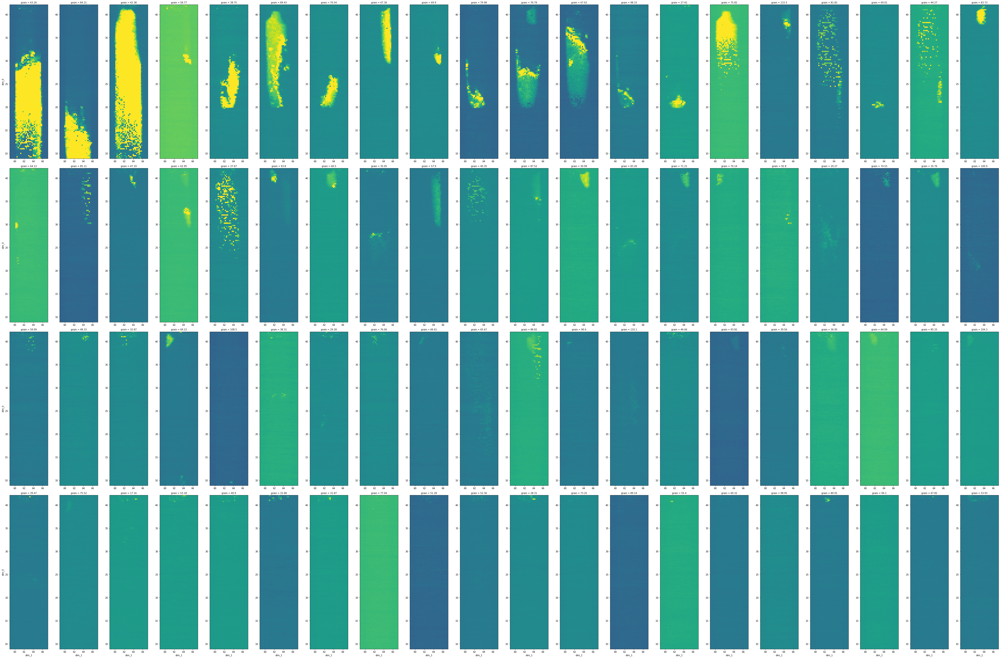

In [12]:
facet = ds.set_index({"grain": "Q"})["intensity"].plot.imshow(
    col="grain", col_wrap=20, 
    size=10, aspect=0.3,
    vmin=ds["intensity"].mean() - 3 * ds["intensity"].std(),
    vmax=ds["intensity"].mean() + 3 * ds["intensity"].std(),
    add_colorbar=False, sharex=False, sharey=False
)
set_real_aspect(facet.axes)
plt.show()

In [13]:
ds = xr.load_dataset(DATA_FILES[6])
ds

<xarray.Dataset>
Dimensions:    (dim_0: 133, dim_1: 33, grain: 80, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * dim_0      (dim_0) float64 9.0 9.25 9.5 9.75 10.0 ... 41.25 41.5 41.75 42.0
  * grain      (grain) int32 42 50 75 86 9 47 54 34 ... 37 79 22 56 59 32 35 80
  * dim_1      (dim_1) float64 59.0 59.25 59.5 59.75 ... 66.25 66.5 66.75 67.0
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) int16 316 315 313 318 312 ... 325 314 310 320
    light      (pixel_y, pixel_x) int16 15 15 15 15 62 14 ... 17 42 15 47 15 15
    intensity  (grain, dim_0, dim_1) float64 329.0 329.1 329.2 ... 325.1 325.1
    y          (grain) int32 2261 2638 3318 3723 486 ... 2852 1344 1785 3568
    dy         (grain) int32 60 60 60 60 60 60 60 60 ... 60 60 60 60 60 60 60 60
    x          (grain) int32 1351 3010 1197 2900 1710 ... 1472 886 2564 519 2063
    dx         (grain) int32 60 60 60 60 60 60 60 60 ... 60 60 60 60 60 60 60 60
    Q          (grain) float64 26.47 50.24 58.6 76.72 ... 48.66 67.11 59.08

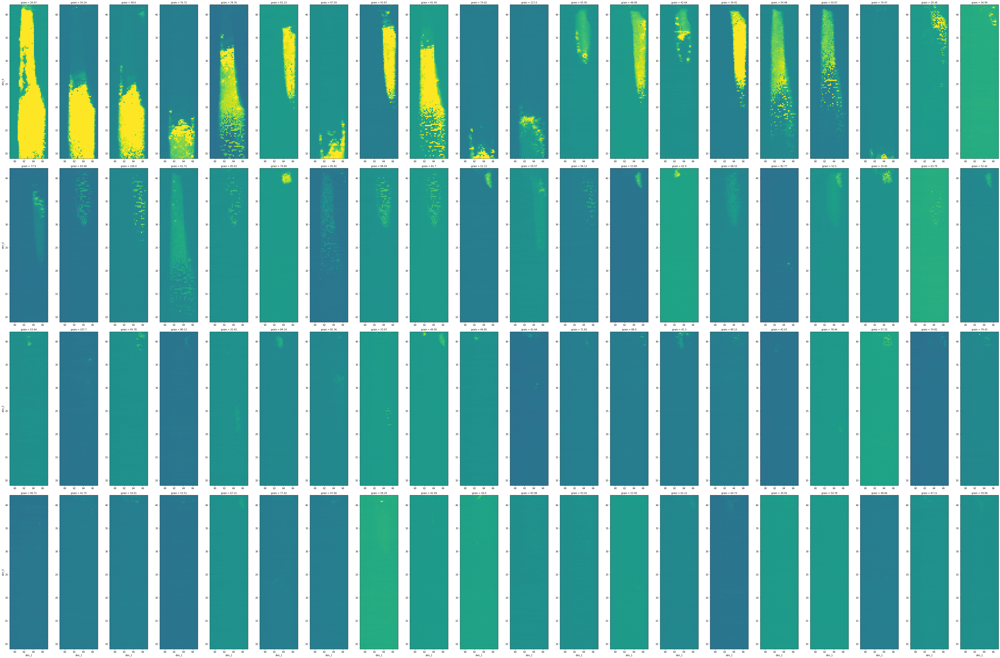

In [14]:
facet = ds.set_index({"grain": "Q"})["intensity"].plot.imshow(
    col="grain", col_wrap=20, 
    size=10, aspect=0.3,
    vmin=ds["intensity"].mean() - 3 * ds["intensity"].std(),
    vmax=ds["intensity"].mean() + 3 * ds["intensity"].std(),
    add_colorbar=False, sharex=False, sharey=False
)
set_real_aspect(facet.axes)
plt.show()

In [17]:
ds = xr.load_dataset(DATA_FILES[7])
ds

<xarray.Dataset>
Dimensions:    (dim_0: 801, grain: 50, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * dim_0      (dim_0) float64 89.0 89.0 89.0 89.01 ... 90.99 91.0 91.0 91.0
  * grain      (grain) int32 640 67 0 223 163 116 ... 172 480 615 612 486 171
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) int16 310 311 304 312 306 ... 314 306 304 314
    light      (pixel_y, pixel_x) int16 27 24 28 27 24 24 ... 26 22 34 33 28 33
    intensity  (grain, dim_0) float64 326.3 326.5 326.1 ... 316.1 316.0 316.2
    y          (grain) int32 3839 390 49 1338 1003 ... 2865 3680 3672 2864 1022
    dy         (grain) int32 70 70 70 70 70 70 70 70 ... 70 70 70 70 70 70 70 70
    x          (grain) int32 2292 1538 2519 1636 2611 ... 2878 1340 2818 1531
    dx         (grain) int32 70 70 70 70 70 70 70 70 ... 70 70 70 70 70 70 70 70
    Q          (grain) float64 71.84 84.21 99.04 42.81 ... 69.03 47.53 57.67

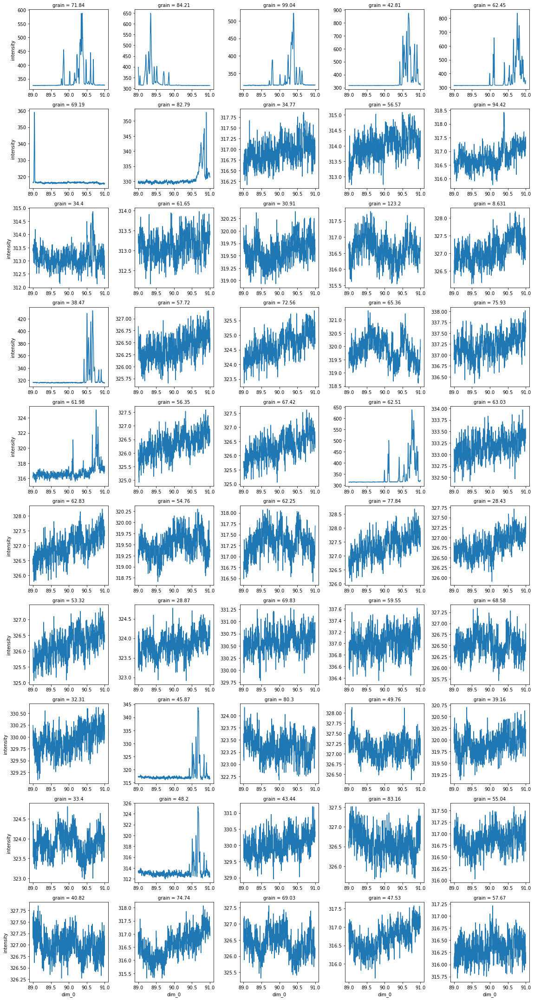

In [18]:
ds.set_index({"grain": "Q"})["intensity"].plot.line(
    col="grain", col_wrap=5, 
    sharex=False, sharey=False
)
plt.show()

In [19]:
ds = xr.load_dataset(DATA_FILES[9])
ds

<xarray.Dataset>
Dimensions:    (dim_0: 671, grain: 50, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * dim_0      (dim_0) float64 44.0 44.0 44.01 44.01 ... 45.67 45.67 45.67 45.67
  * grain      (grain) int32 569 971 2332 960 1818 ... 708 1083 1130 1655 1175
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) int16 301 299 291 301 293 ... 309 299 294 307
    light      (pixel_y, pixel_x) int16 43 53 49 46 47 48 ... 40 52 50 47 47 47
    intensity  (grain, dim_0) float64 289.6 290.9 289.8 ... 316.4 316.2 315.9
    y          (grain) int32 804 1394 3441 1393 2652 ... 1504 1575 2383 1607
    dy         (grain) int32 23 23 23 23 23 23 23 23 ... 23 23 23 23 23 23 23 23
    x          (grain) int32 1362 2564 1755 2527 309 2719 ... 508 15 49 347 14
    dx         (grain) int32 23 23 23 23 23 23 23 23 ... 23 23 23 23 23 23 23 23
    Q          (grain) float64 69.34 46.87 54.16 45.98 ... 89.72 71.83 90.72

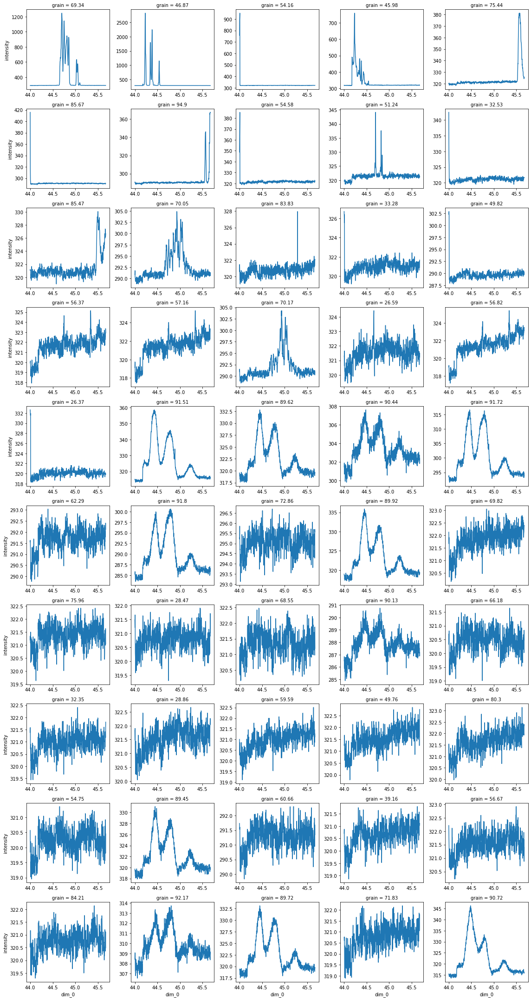

In [20]:
ds.set_index({"grain": "Q"})["intensity"].plot.line(
    col="grain", col_wrap=5, 
    sharex=False, sharey=False
)
plt.show()

In [21]:
ds = xr.load_dataset(DATA_FILES[10])
ds

<xarray.Dataset>
Dimensions:    (dim_0: 401, grain: 50, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * dim_0      (dim_0) float64 89.0 89.0 89.01 89.02 ... 90.98 90.99 91.0 91.0
  * grain      (grain) int32 213 0 278 105 376 123 ... 384 521 414 257 316 203
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) int16 311 311 310 312 304 ... 321 311 309 316
    light      (pixel_y, pixel_x) int16 25 27 22 30 30 21 ... 29 26 27 22 22 23
    intensity  (grain, dim_0) float64 319.4 320.0 320.6 ... 326.5 325.9 325.9
    y          (grain) int32 1335 46 1762 649 2388 ... 3318 2653 1634 2012 1314
    dy         (grain) int32 60 60 60 60 60 60 60 60 ... 60 60 60 60 60 60 60 60
    x          (grain) int32 1675 2520 1223 2645 377 ... 57 2015 2581 2682 1033
    dx         (grain) int32 60 60 60 60 60 60 60 60 ... 60 60 60 60 60 60 60 60
    Q          (grain) float64 42.4 99.17 38.77 76.78 ... 39.37 34.58 58.31

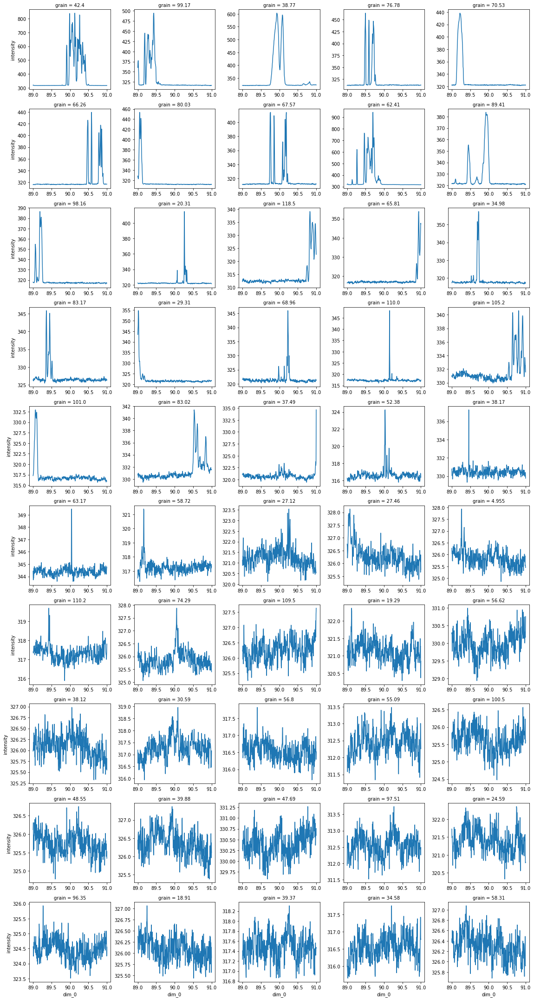

In [22]:
ds.set_index({"grain": "Q"})["intensity"].plot.line(
    col="grain", col_wrap=5, 
    sharex=False, sharey=False
)
plt.show()

In [23]:
ds = xr.load_dataset(DATA_FILES[11])
ds

<xarray.Dataset>
Dimensions:    (dim_0: 46, dim_1: 56, grain: 100, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * grain      (grain) int32 85 68 17 82 144 18 132 ... 40 102 135 118 42 156 6
  * dim_1      (dim_1) float64 61.0 61.1 61.2 61.3 61.4 ... 66.2 66.3 66.4 66.5
  * dim_0      (dim_0) float64 38.0 38.1 38.2 38.3 38.4 ... 42.2 42.3 42.4 42.5
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) int16 318 316 312 316 312 ... 324 314 310 320
    light      (pixel_y, pixel_x) int16 13 12 15 15 14 13 ... 16 14 16 15 15 15
    intensity  (grain, dim_0, dim_1) float64 326.0 326.5 326.4 ... 306.0 306.7
    y          (grain) int32 2258 1511 476 2154 3294 ... 3110 2786 909 3556 187
    dy         (grain) int32 40 40 40 40 40 40 40 40 ... 40 40 40 40 40 40 40 40
    x          (grain) int32 1349 2607 1697 2832 2122 ... 1775 2142 2058 2722
    dx         (grain) int32 40 40 40 40 40 40 40 40 ... 40 40 40 40 40 40 40 40
    Q          (grain) float64 26.06 44.23 78.98 40.22 ... 59.97 58.8 95.89

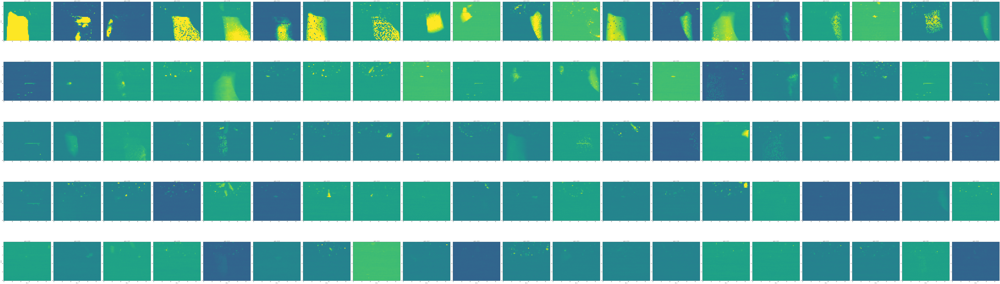

In [24]:
facet = ds.set_index({"grain": "Q"})["intensity"].plot.imshow(
    col="grain", col_wrap=20, 
    size=10, aspect=46/56,
    vmin=ds["intensity"].mean() - 3 * ds["intensity"].std(),
    vmax=ds["intensity"].mean() + 3 * ds["intensity"].std(),
    add_colorbar=False, sharex=False, sharey=False
)
set_real_aspect(facet.axes)
plt.show()

In [25]:
ds = xr.load_dataset(DATA_FILES[12])
ds

<xarray.Dataset>
Dimensions:    (dim_0: 801, grain: 50, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * dim_0      (dim_0) float64 -1.0 -0.9975 -0.995 -0.9925 ... 0.995 0.9975 1.0
  * grain      (grain) int32 2904 695 1871 2909 3145 ... 303 3278 1974 1038 2352
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) int16 300 302 298 302 290 ... 311 300 292 306
    light      (pixel_y, pixel_x) int16 45 46 53 45 51 55 ... 47 47 48 46 48 45
    intensity  (grain, dim_0) float64 691.3 330.3 329.9 ... 301.6 302.0 301.5
    y          (grain) int32 3308 787 2254 3312 3582 ... 310 3755 2311 1245 2662
    dy         (grain) int32 25 25 25 25 25 25 25 25 ... 25 25 25 25 25 25 25 25
    x          (grain) int32 1189 833 1351 1185 2317 ... 904 1861 1547 492 2987
    dx         (grain) int32 25 25 25 25 25 25 25 25 ... 25 25 25 25 25 25 25 25
    Q          (grain) float64 58.44 81.74 26.46 58.69 ... 67.1 17.89 78.82 49.7

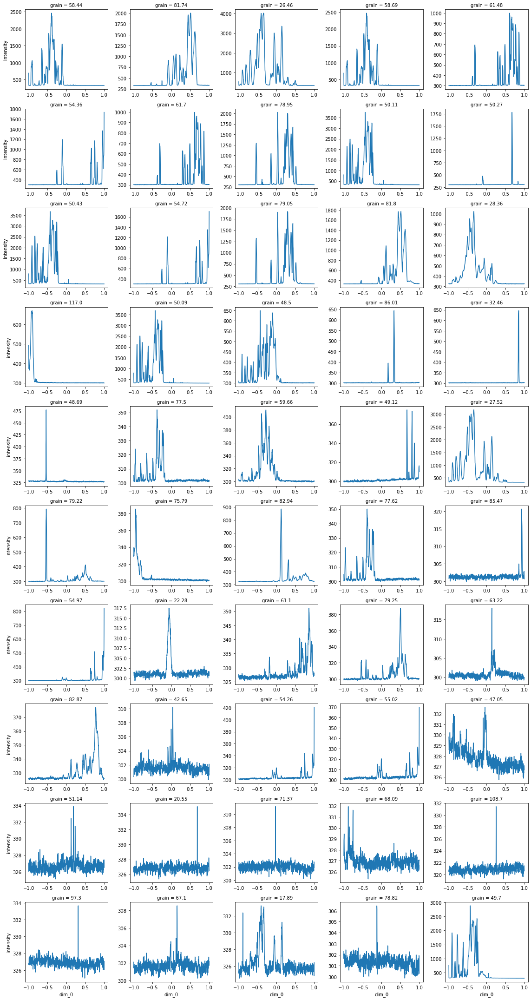

In [26]:
ds.set_index({"grain": "Q"})["intensity"].plot.line(
    col="grain", col_wrap=5, 
    sharex=False, sharey=False
)
plt.show()

In [27]:
ds = xr.load_dataset(DATA_FILES[13])
ds

<xarray.Dataset>
Dimensions:    (dim_0: 401, grain: 50, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * dim_0      (dim_0) float64 45.0 45.0 45.01 45.01 ... 45.99 45.99 46.0 46.0
  * grain      (grain) int32 46 42 641 60 458 246 72 ... 681 507 314 260 69 633
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) int16 304 304 302 308 298 ... 314 300 297 300
    light      (pixel_y, pixel_x) int16 46 46 38 46 42 51 ... 42 48 46 47 46 52
    intensity  (grain, dim_0) float64 320.0 320.4 320.1 ... 289.4 289.6 289.3
    y          (grain) int32 153 147 3709 204 2655 ... 2918 1800 1430 234 3682
    dy         (grain) int32 23 23 23 23 23 23 23 23 ... 23 23 23 23 23 23 23 23
    x          (grain) int32 1134 1134 1674 2679 310 ... 1706 2749 1084 939 2735
    dx         (grain) int32 23 23 23 23 23 23 23 23 ... 23 23 23 23 23 23 23 23
    Q          (grain) float64 99.11 99.34 66.21 94.7 ... 53.04 99.45 71.86

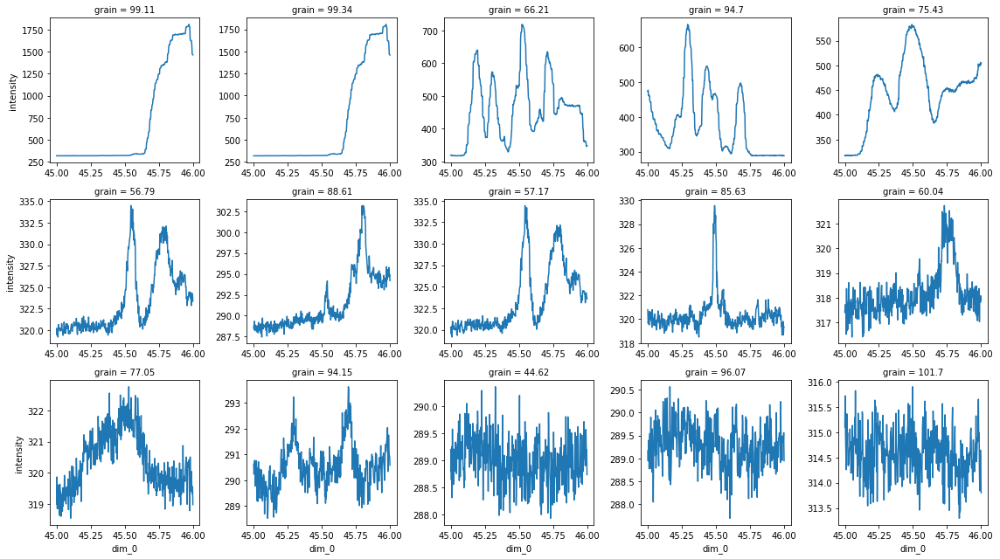

In [29]:
ds.set_index({"grain": "Q"})["intensity"][:15].plot.line(
    col="grain", col_wrap=5, 
    sharex=False, sharey=False
)
plt.show()

In [30]:
ds = xr.load_dataset(DATA_FILES[14])
ds

<xarray.Dataset>
Dimensions:    (dim_0: 61, dim_1: 29, grain: 80, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * grain      (grain) int32 45 10 18 50 37 42 63 81 ... 53 90 71 0 47 80 38 84
  * dim_0      (dim_0) float64 28.0 28.25 28.5 28.75 ... 42.25 42.5 42.75 43.0
  * dim_1      (dim_1) float64 61.0 61.25 61.5 61.75 ... 67.25 67.5 67.75 68.0
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) int16 317 316 313 319 313 ... 327 314 311 320
    light      (pixel_y, pixel_x) int16 14 15 15 14 31 13 ... 16 15 13 15 14 15
    intensity  (grain, dim_0, dim_1) float64 533.0 542.9 374.1 ... 327.5 327.4
    y          (grain) int32 2265 485 803 2488 1524 ... 44 2346 3323 1663 3362
    dy         (grain) int32 40 40 40 40 40 40 40 40 ... 40 40 40 40 40 40 40 40
    x          (grain) int32 1352 1715 824 143 2614 ... 1870 699 1164 1267 42
    dx         (grain) int32 40 40 40 40 40 40 40 40 ... 40 40 40 40 40 40 40 40
    Q          (grain) float64 26.43 78.77 81.43 81.28 ... 59.62 39.89 97.82

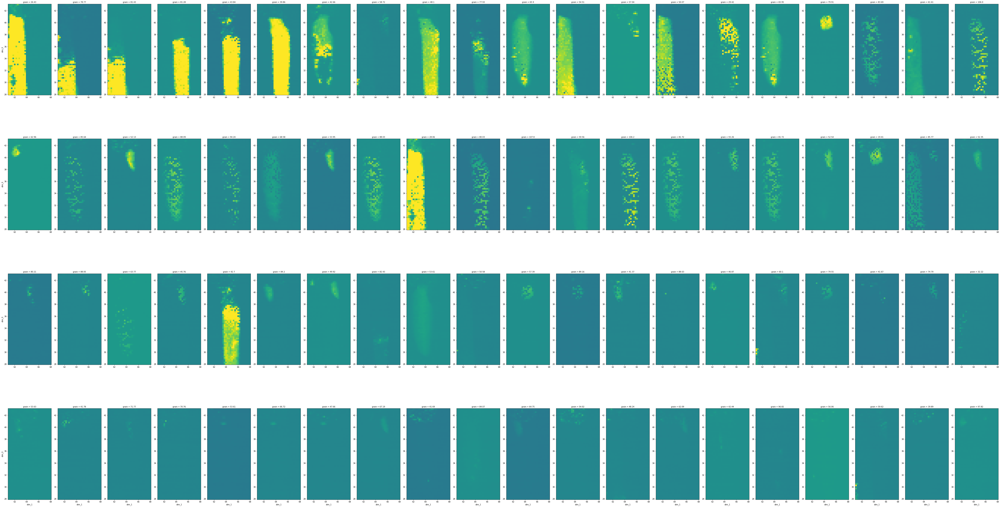

In [31]:
facet = ds.set_index({"grain": "Q"})["intensity"].plot.imshow(
    col="grain", col_wrap=20, 
    size=10, aspect=29/80,
    vmin=ds["intensity"].mean() - 3 * ds["intensity"].std(),
    vmax=ds["intensity"].mean() + 3 * ds["intensity"].std(),
    add_colorbar=False, sharex=False, sharey=False
)
set_real_aspect(facet.axes)
plt.show()

In [37]:
ds = xr.load_dataset(DATA_FILES[17])
ds

<xarray.Dataset>
Dimensions:    (dim_0: 133, dim_1: 33, grain: 80, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * dim_0      (dim_0) float64 9.0 9.25 9.5 9.75 10.0 ... 41.25 41.5 41.75 42.0
  * grain      (grain) int32 41 52 47 69 60 16 49 5 ... 45 74 11 17 46 28 50 81
  * dim_1      (dim_1) float64 59.0 59.25 59.5 59.75 ... 66.25 66.5 66.75 67.0
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) int16 317 315 312 318 311 ... 325 313 308 318
    light      (pixel_y, pixel_x) int16 14 15 15 15 16 14 ... 19 14 16 17 17 17
    intensity  (grain, dim_0, dim_1) float64 330.3 330.5 330.5 ... 329.1 328.8
    y          (grain) int32 1459 2045 1748 2973 2516 ... 1651 1013 1931 3315
    dy         (grain) int32 80 80 80 80 80 80 80 80 ... 80 80 80 80 80 80 80 80
    x          (grain) int32 873 663 769 2390 2040 ... 2321 2765 1283 1074 2242
    dx         (grain) int32 80 80 80 80 80 80 80 80 ... 80 80 80 80 80 80 80 80
    Q          (grain) float64 59.5 58.15 57.18 38.29 ... 62.49 41.38 49.57

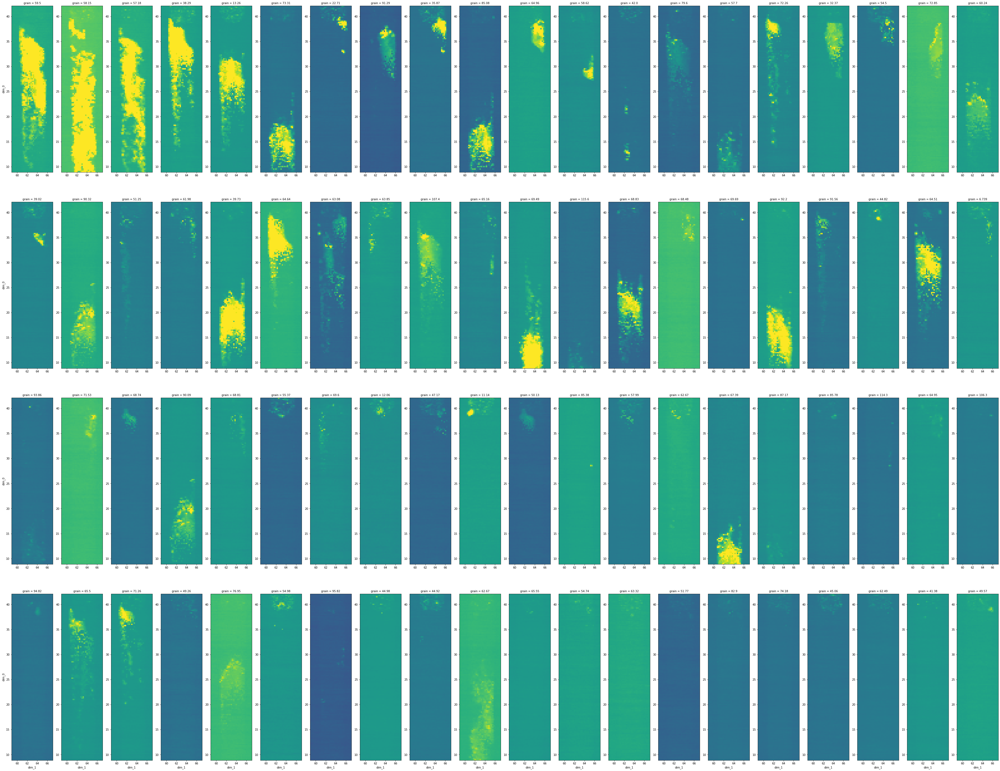

In [38]:
facet = ds.set_index({"grain": "Q"})["intensity"].plot.imshow(
    col="grain", col_wrap=20, 
    size=10, aspect=33/133,
    vmin=ds["intensity"].mean() - 3 * ds["intensity"].std(),
    vmax=ds["intensity"].mean() + 3 * ds["intensity"].std(),
    add_colorbar=False, sharex=False, sharey=False
)
set_real_aspect(facet.axes)
plt.show()

## PARADIM-1

In [39]:
ds = xr.load_dataset(DATA_FILES[18])
ds

<xarray.Dataset>
Dimensions:    (dim_0: 801, grain: 50, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * dim_0      (dim_0) float64 173.5 173.5 173.5 173.5 ... 175.5 175.5 175.5
  * grain      (grain) int32 569 652 726 712 271 86 ... 746 371 351 216 564 493
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) int16 296 302 296 303 299 ... 311 292 296 303
    light      (pixel_y, pixel_x) int16 53 44 46 49 42 48 ... 47 46 45 52 49 50
    intensity  (grain, dim_0) float64 924.4 322.3 322.5 ... 320.8 321.0 320.9
    y          (grain) int32 2730 3251 3786 3677 1247 ... 1567 958 2718 2380
    dy         (grain) int32 31 31 31 31 31 31 31 31 ... 31 31 31 31 31 31 31 31
    x          (grain) int32 2936 1269 368 1895 1308 ... 2901 3029 3027 1366
    dx         (grain) int32 31 31 31 31 31 31 31 31 ... 31 31 31 31 31 31 31 31
    Q          (grain) float64 48.91 54.36 97.43 63.68 ... 73.89 52.2 26.55

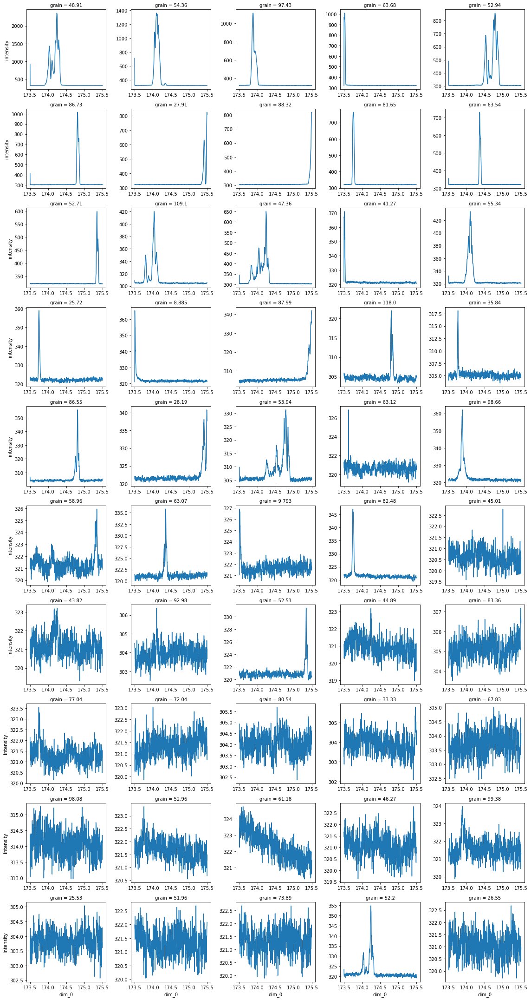

In [41]:
ds.set_index({"grain": "Q"})["intensity"].plot.line(
    col="grain", col_wrap=5, 
    sharex=False, sharey=False
)
plt.show()

In [42]:
ds = xr.load_dataset(DATA_FILES[19])
ds

<xarray.Dataset>
Dimensions:    (dim_0: 801, grain: 12, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * dim_0      (dim_0) float64 173.5 173.5 173.5 173.5 ... 175.5 175.5 175.5
  * grain      (grain) int32 0 4 2 9 10 8 11 1 7 3 6 5
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) int16 300 297 297 301 300 ... 308 297 294 300
    light      (pixel_y, pixel_x) int16 45 46 51 46 41 51 ... 49 43 59 52 45 50
    intensity  (grain, dim_0) float64 304.6 304.6 304.9 ... 304.8 305.1 304.4
    y          (grain) int32 305 1410 598 3255 3519 ... 429 2540 1247 2004 1833
    dy         (grain) int32 31 31 31 31 31 31 31 31 31 31 31 31
    x          (grain) int32 2500 2055 2186 1270 1781 ... 1437 306 1305 617 1138
    dx         (grain) int32 31 31 31 31 31 31 31 31 31 31 31 31
    Q          (grain) float64 88.55 37.63 73.74 54.48 ... 53.01 60.48 40.48

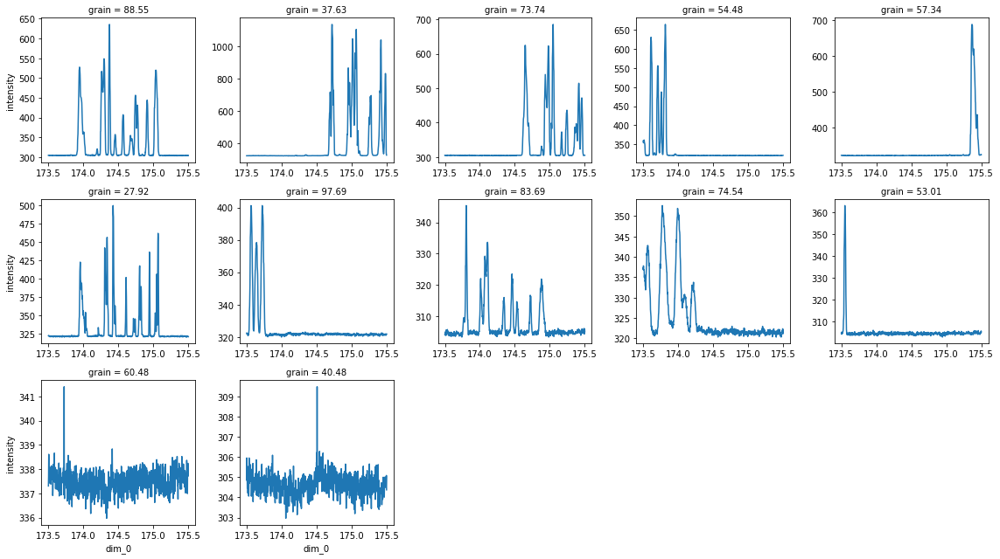

In [43]:
ds.set_index({"grain": "Q"})["intensity"].plot.line(
    col="grain", col_wrap=5, 
    sharex=False, sharey=False
)
plt.show()

In [44]:
ds = xr.load_dataset(DATA_FILES[20])
ds

<xarray.Dataset>
Dimensions:    (dim_0: 33, dim_1: 33, grain: 80, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * grain      (grain) int32 50 82 76 59 37 0 31 20 ... 3 42 39 10 11 15 55 53
  * dim_0      (dim_0) float64 33.0 33.25 33.5 33.75 ... 40.25 40.5 40.75 41.0
  * dim_1      (dim_1) float64 61.5 61.75 62.0 62.25 ... 68.75 69.0 69.25 69.5
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) int16 317 316 312 318 311 ... 327 315 310 322
    light      (pixel_y, pixel_x) int16 13 13 13 12 17 12 ... 14 12 12 13 14 13
    intensity  (grain, dim_0, dim_1) float64 508.8 386.0 475.3 ... 310.8 310.6
    y          (grain) int32 2420 3677 3419 2729 1609 ... 501 562 733 2557 2515
    dy         (grain) int32 26 26 26 26 26 26 26 26 ... 26 26 26 26 26 26 26 26
    x          (grain) int32 1862 1894 319 2936 729 ... 2935 1522 1814 2056 1000
    dx         (grain) int32 26 26 26 26 26 26 26 26 ... 26 26 26 26 26 26 26 26
    Q          (grain) float64 8.843 63.68 89.14 48.89 ... 67.55 15.23 44.09

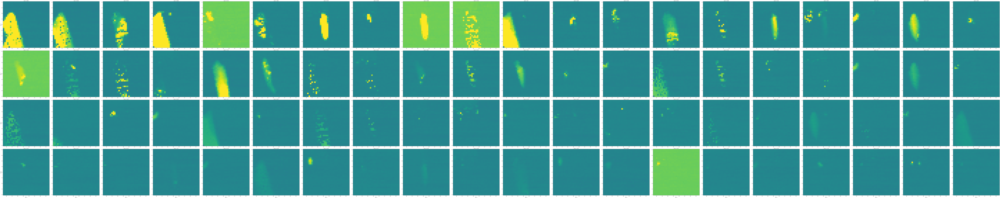

In [45]:
facet = ds.set_index({"grain": "Q"})["intensity"].plot.imshow(
    col="grain", col_wrap=20, 
    size=10, aspect=33/33,
    vmin=ds["intensity"].mean() - 3 * ds["intensity"].std(),
    vmax=ds["intensity"].mean() + 3 * ds["intensity"].std(),
    add_colorbar=False, sharex=False, sharey=False
)
set_real_aspect(facet.axes)
plt.show()

In [50]:
# there is an additional dimension
ds = xr.load_dataset(DATA_FILES[21]).squeeze("dim_0")
ds

<xarray.Dataset>
Dimensions:    (dim_1: 101, grain: 26, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * dim_1      (dim_1) float64 180.0 179.9 179.8 179.7 ... 170.2 170.1 170.0
  * grain      (grain) int32 13 16 17 10 23 3 21 6 9 ... 4 7 24 5 15 25 8 19 12
    dim_0      float64 -2.5
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) float64 298.0 303.0 300.0 ... 298.0 314.0
    light      (pixel_y, pixel_x) float64 45.0 36.0 35.0 32.0 ... 34.0 31.0 33.0
    intensity  (grain, dim_1) float64 17.53 17.46 17.34 ... 18.68 18.87 19.12
    y          (grain) int32 1410 2704 2730 1087 3522 ... 3803 830 3119 1245
    dy         (grain) int32 50 50 50 50 50 50 50 50 ... 50 50 50 50 50 50 50 50
    x          (grain) int32 2055 1094 2935 540 1782 ... 30 2302 2682 2362 1312
    dx         (grain) int32 50 50 50 50 50 50 50 50 ... 50 50 50 50 50 50 50 50
    Q          (grain) float64 37.63 43.42 48.87 81.29 ... 70.44 43.34 52.92

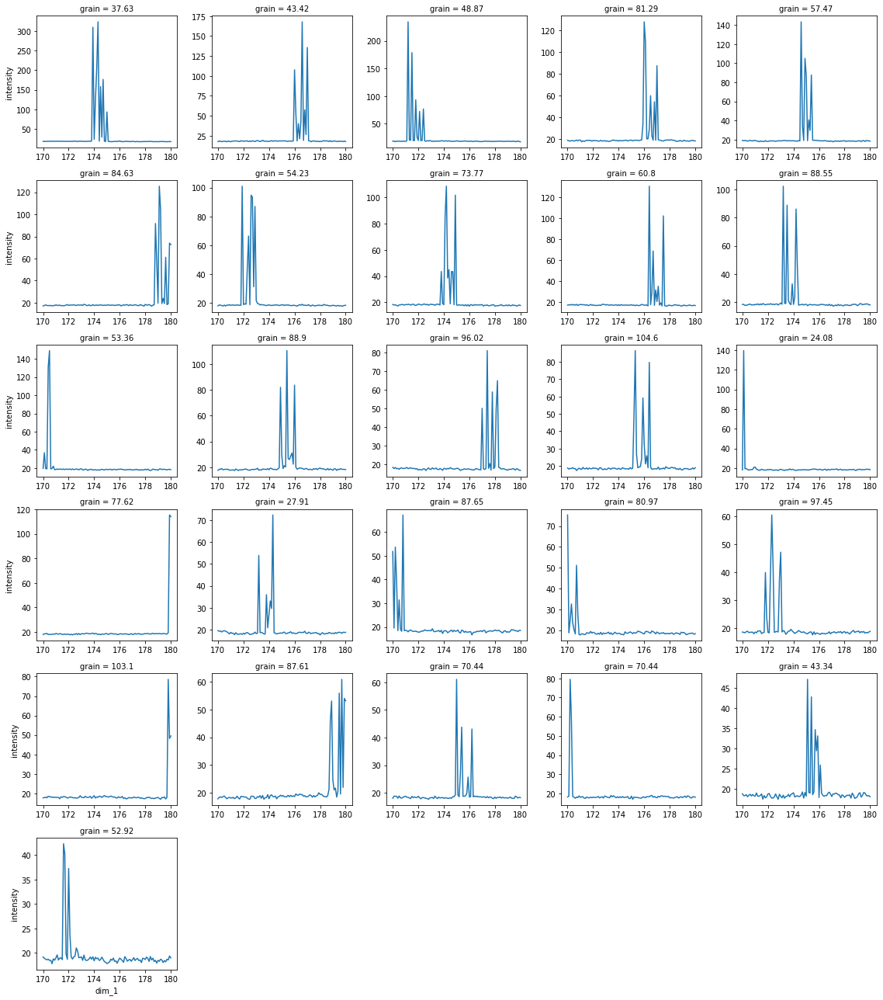

In [51]:
ds.set_index({"grain": "Q"})["intensity"].plot.line(
    col="grain", col_wrap=5, 
    sharex=False, sharey=False
)
plt.show()

In [52]:
# there is an additional dimension
ds = xr.load_dataset(DATA_FILES[22])
ds

<xarray.Dataset>
Dimensions:    (dim_0: 801, grain: 19, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * dim_0      (dim_0) float64 173.5 173.5 173.5 173.5 ... 175.5 175.5 175.5
  * grain      (grain) int32 11 14 17 6 16 1 13 18 5 2 15 3 10 7 12 9 0 4 8
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) int16 301 300 298 299 297 ... 306 297 293 305
    light      (pixel_y, pixel_x) int16 41 47 46 48 45 48 ... 47 45 52 48 51 42
    intensity  (grain, dim_0) float64 319.8 319.8 319.7 ... 320.6 320.6 321.7
    y          (grain) int32 2730 3251 3787 1247 3677 ... 2767 2421 210 424 2312
    dy         (grain) int32 31 31 31 31 31 31 31 31 ... 31 31 31 31 31 31 31 31
    x          (grain) int32 2936 1269 367 1308 1895 ... 1719 1862 1681 2984 448
    dx         (grain) int32 31 31 31 31 31 31 31 31 ... 31 31 31 31 31 31 31 31
    Q          (grain) float64 48.91 54.36 97.49 52.94 ... 90.64 91.38 67.15

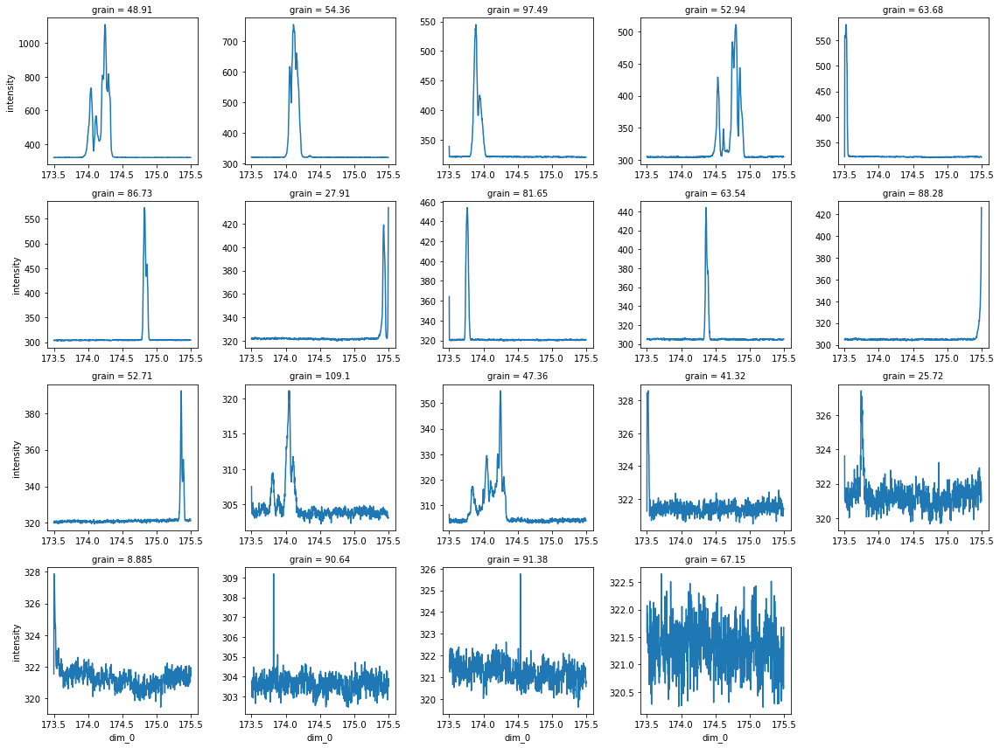

In [53]:
ds.set_index({"grain": "Q"})["intensity"].plot.line(
    col="grain", col_wrap=5, 
    sharex=False, sharey=False
)
plt.show()

In [54]:
# there is an additional dimension
ds = xr.load_dataset(DATA_FILES[23])
ds

<xarray.Dataset>
Dimensions:    (dim_0: 79, dim_1: 33, grain: 80, pixel_x: 3072, pixel_y: 3888)
Coordinates:
  * grain      (grain) int32 89 110 46 50 119 72 122 ... 70 91 43 17 94 61 35
  * dim_0      (dim_0) float64 21.5 21.75 22.0 22.25 ... 40.25 40.5 40.75 41.0
  * dim_1      (dim_1) float64 61.5 61.75 62.0 62.25 ... 68.75 69.0 69.25 69.5
Dimensions without coordinates: pixel_x, pixel_y
Data variables:
    dark       (pixel_y, pixel_x) float64 318.0 318.0 314.0 ... 312.0 323.0
    light      (pixel_y, pixel_x) float64 9.0 8.0 9.0 10.0 ... 10.0 9.0 9.0 8.0
    intensity  (grain, dim_0, dim_1) float64 3.994 3.824 4.021 ... 4.892 5.022
    y          (grain) int32 2732 3247 1409 1495 3646 ... 562 2842 1955 1049
    dy         (grain) int32 32 32 32 32 32 32 32 32 ... 32 32 32 32 32 32 32 32
    x          (grain) int32 2935 1266 2056 1107 916 ... 1910 1522 1342 672 1410
    dx         (grain) int32 32 32 32 32 32 32 32 32 ... 32 32 32 32 32 32 32 32
    Q          (grain) float64 48.9 54.29 37.68 50.3 ... 77.16 38.17 58.5 58.54

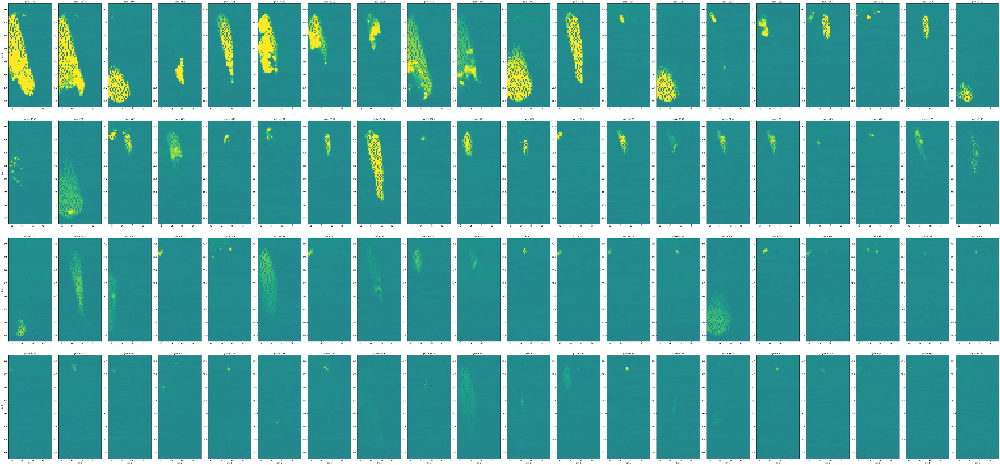

In [55]:
facet = ds.set_index({"grain": "Q"})["intensity"].plot.imshow(
    col="grain", col_wrap=20, 
    size=10, aspect=33/79,
    vmin=ds["intensity"].mean() - 3 * ds["intensity"].std(),
    vmax=ds["intensity"].mean() + 3 * ds["intensity"].std(),
    add_colorbar=False, sharex=False, sharey=False
)
set_real_aspect(facet.axes)
plt.show()